In [1]:
import anndata as ad
import scanpy as sc
import numpy as np
from joypy import joyplot
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import scipy
import scipy.stats
import seaborn as sns
import scanorama
import scgen

ModuleNotFoundError: No module named 'joypy'

In [2]:
sc.set_figure_params(figsize = [12, 10])

In [3]:
colors_map = {"control": "#DAD7CD",
    "premature stop": "#A3B18A",
    "sB": "#C8C8D0",
    "sBmid": "#C8C8D0",
    "sC": "#61E8E1",
    "sC_batch": "#F25757",
    "sD": "#C8C8D0",
    "sEndD": "#C8C8D0",
    "sEndC": "#F2E863" }

## Reading data / preprocessing

In [8]:
ct0 = ad.read_h5ad("data/batcheffect_dataseta0.h5ad")
ct1 = ad.read_h5ad("../data/batcheffect_dataseta1_aligned.h5ad")
ct2 = ad.read_h5ad("../data/batcheffect_dataseta2_aligned.h5ad")
be0 = ad.read_h5ad("../data/batcheffect99_datasetb0_aligned.h5ad")
be1 = ad.read_h5ad("../data/batcheffect99_datasetb1_aligned.h5ad")
be2 = ad.read_h5ad("../data/batcheffect99_datasetb2_aligned.h5ad")

FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = '../data/batcheffect_dataseta1_aligned.h5ad', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [ ]:
be0.obs["ground_truth_groups_batch"] = be0.obs.ground_truth_groups.cat.rename_categories({'sC': 'sC_batch'})
ct0.obs["ground_truth_groups_batch"] = ct0.obs.ground_truth_groups

In [ ]:
def plot_data(adata):
    sc.tl.umap(adata)
    sc.pl.umap(adata, color = ["ground_truth_groups_batch", "pseudotime", "pt_warped", "ground_truth"])


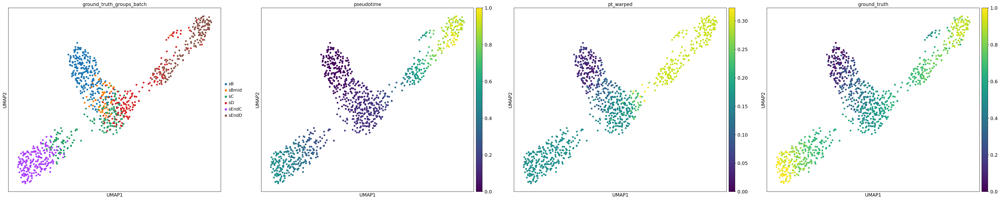

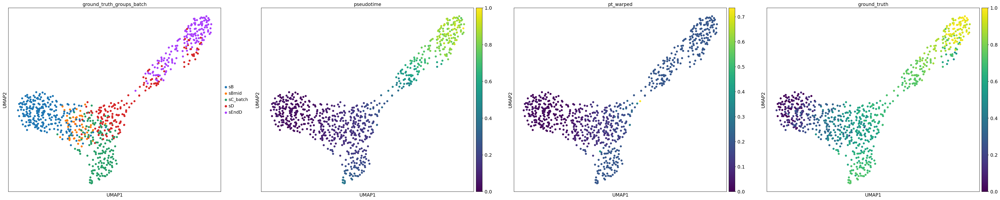

KeyError: 'Could not find key ground_truth_groups_batch in .var_names or .obs.columns.'

<Figure size 4156.8x800 with 0 Axes>

In [ ]:
plot_data(ct0)
plot_data(be0)

/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warn

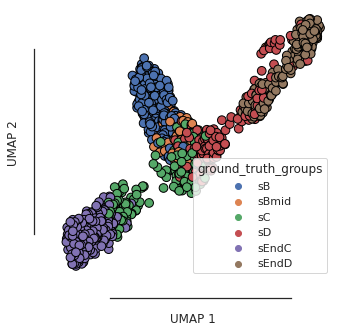

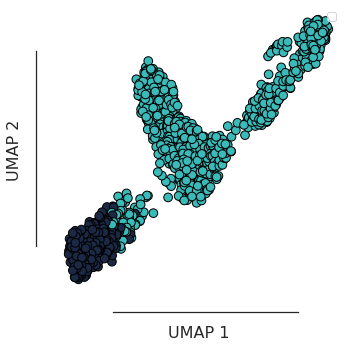

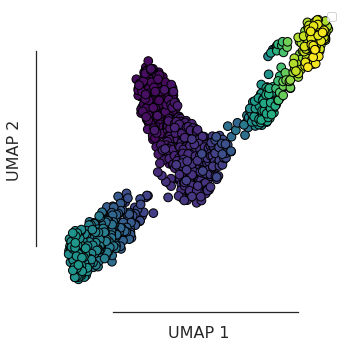

In [ ]:
sns.set(rc = {'figure.figsize':(5,5)})
sns.set_style(style='white')
g = sns.scatterplot(ct0.obsm["X_umap"][:,0], ct0.obsm["X_umap"][:,1], hue = ct0.obs.ground_truth_groups, s = 75, linewidth = 1, edgecolor="black")
sns.despine(offset = 20, trim=True)
g.set(xticklabels=[])
g.set(yticklabels=[])
g.set(xlabel="UMAP 1")
g.set(ylabel="UMAP 2")
plt.figure()

sns.set(rc = {'figure.figsize':(5,5)})
sns.set_style(style='white')
g = sns.scatterplot(ct0.obsm["X_umap"][:,0], ct0.obsm["X_umap"][:,1], hue = ct0.obs.ground_truth_groups, palette = ["#3abbba", "#3abbba", "#3abbba", "#3abbba", "#1b2944", "#3abbba"], s = 75, linewidth = 1, edgecolor="black")
sns.despine(offset = 20, trim=True)
g.set(xticklabels=[])
g.set(yticklabels=[])
g.set_xlabel("UMAP 1", fontsize = 16)
g.set_ylabel("UMAP 2", fontsize = 16)
plt.legend([], [])
plt.tight_layout()
plt.savefig("scatter_control.svg")
plt.figure()

g = sns.scatterplot(ct0.obsm["X_umap"][:,0], ct0.obsm["X_umap"][:,1], hue = ct0.obs.pseudotime, palette = "viridis", s = 75, linewidth = 1, edgecolor="black")
sns.despine(offset = 20, trim=True)
g.set(xticklabels=[])
g.set(yticklabels=[])
g.set_xlabel("UMAP 1", fontsize = 16)
g.set_ylabel("UMAP 2", fontsize = 16)
plt.legend([], [])
plt.tight_layout()
plt.savefig("pseudotime_control.svg")


/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warn

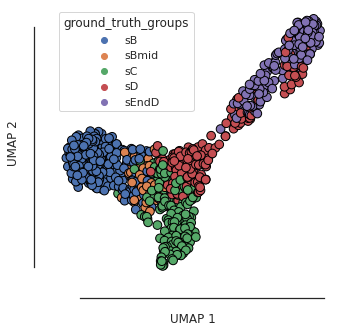

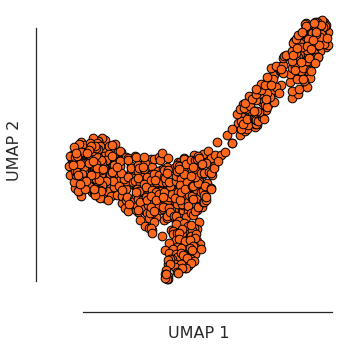

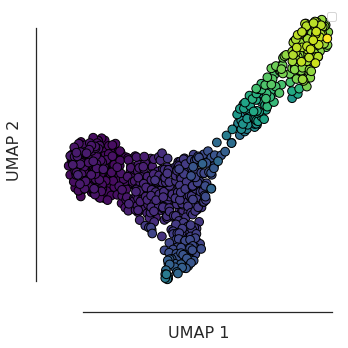

In [ ]:
sns.set(rc = {'figure.figsize':(5,5)})
sns.set_style(style='white')
g = sns.scatterplot(be0.obsm["X_umap"][:,0], be0.obsm["X_umap"][:,1], hue = be0.obs.ground_truth_groups, s = 75, linewidth = 1, edgecolor="black")
sns.despine(offset = 20, trim=True)
g.set(xticklabels=[])
g.set(yticklabels=[])
g.set(xlabel="UMAP 1")
g.set(ylabel="UMAP 2")

plt.figure()

sns.set(rc = {'figure.figsize':(5,5)})
sns.set_style(style='white')
g = sns.scatterplot(be0.obsm["X_umap"][:,0], be0.obsm["X_umap"][:,1], color = "#ff681c", s = 75, linewidth = 1, edgecolor = "black")
sns.despine(offset = 20, trim=True)
g.set(xticklabels=[])
g.set(yticklabels=[])
g.set_xlabel("UMAP 1", fontsize = 16)
g.set_ylabel("UMAP 2", fontsize = 16)
plt.tight_layout()
plt.savefig("scatter_batch.svg")

plt.figure()

g = sns.scatterplot(be0.obsm["X_umap"][:,0], be0.obsm["X_umap"][:,1], hue = be0.obs.pseudotime, palette = "viridis", s = 75, linewidth = 1, edgecolor="black")
sns.despine(offset = 20, trim=True)
g.set(xticklabels=[])
g.set(yticklabels=[])
g.set_xlabel("UMAP 1", fontsize = 16)
g.set_ylabel("UMAP 2", fontsize = 16)
plt.legend([], [])
plt.tight_layout()
plt.savefig("pseudotime_batch.svg")


In [ ]:
ct0.obs

,pseudotime,groups,ground_truth_groups,pt_warped,sim_time,cell_id,from,to,percentage,branch,ground_truth
5,0.000000,1,sB,0.000000,70.000000,cell6,sA,sB,0.528967,0,0.194712
297,0.004481,1,sB,0.007764,40.000000,cell298,sA,sB,0.294773,0,0.108506
487,0.004523,1,sB,0.010020,60.000000,cell488,sA,sB,0.355227,0,0.130758
313,0.004861,1,sB,0.011560,10.000000,cell314,sA,sB,0.083123,0,0.030598
374,0.005334,1,sB,0.011560,90.083333,cell375,sA,sB,0.646096,0,0.237827
...,...,...,...,...,...,...,...,...,...,...,...
933,0.984114,3,sEndD,0.912894,530.083333,cell934,sD,sEndD,0.725105,1,0.871754
436,0.985690,3,sEndD,0.916262,650.000000,cell437,sD,sEndD,0.970547,1,0.931483
865,0.989044,3,sEndD,0.919630,766.800000,cell866,sD,sEndD,0.835905,1,0.898717
491,0.991667,3,sEndD,0.919630,710.000000,cell492,sD,sEndD,0.942496,1,0.924657


## Scanorama test

In [ ]:
adatas_cor = scanorama.correct_scanpy([ct0, be0], return_dimred = True)

Found 534 genes among all datasets
[[0.         0.91320755]
 [0.         0.        ]]
Processing datasets (0, 1)


In [ ]:
adata_spatial = sc.concat(
    {"control": adatas_cor[0], "premature stop": adatas_cor[1]},
    label="batch",
    uns_merge="unique",
    index_unique="-",
)



In [ ]:
sc.pp.neighbors(adata_spatial, use_rep="X_scanorama")
sc.tl.umap(adata_spatial)
sc.tl.leiden(adata_spatial, key_added="clusters")

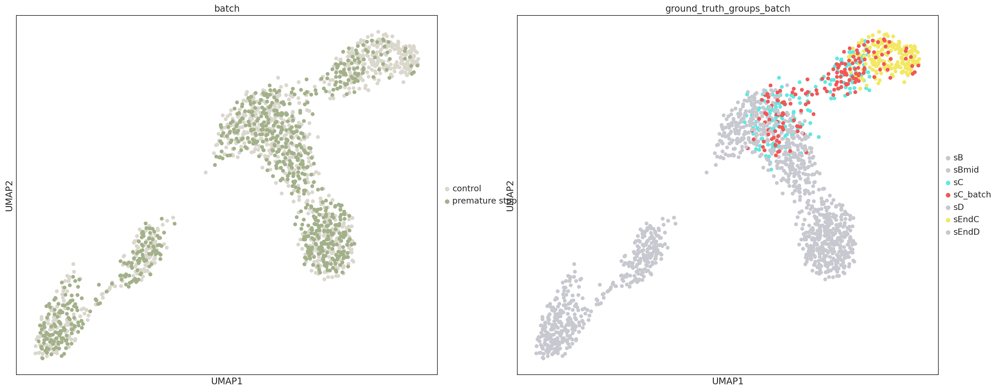

In [ ]:
sc.pl.umap(adata_spatial, color = ["batch", "ground_truth_groups_batch"], palette = colors_map, size = 140)


In [ ]:
adata_spatial.uns["iroot"] = np.flatnonzero(adata_spatial.obs['ground_truth_groups'] == 'sB')[0]
sc.tl.dpt(adata_spatial)

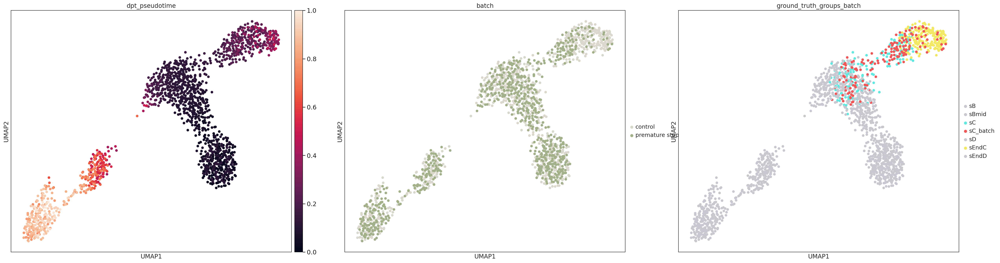

In [ ]:
sc.pl.umap(adata_spatial, color = ["dpt_pseudotime", "batch", "ground_truth_groups_batch"], palette = colors_map, size = 140)


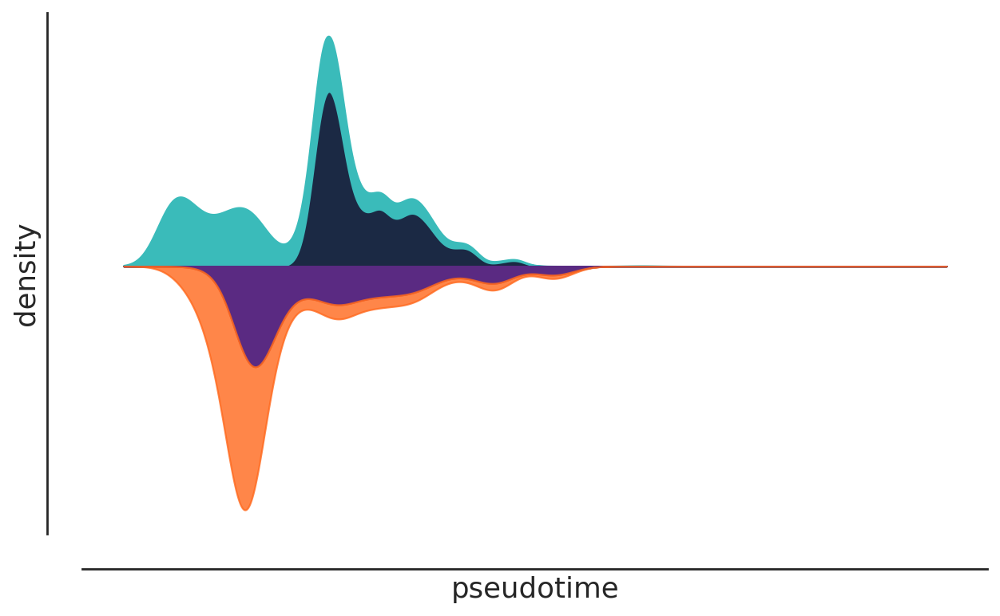

In [ ]:
adata_sep = adata_spatial[adata_spatial.obs["ground_truth_groups"].isin(["sB", "sBmid", "sC", "sEndC"])]

ctrl = adata_sep[adata_sep.obs["batch"] == "control"]
btch = adata_sep[(adata_sep.obs["batch"] == "premature stop") & ~(adata_sep.obs["ground_truth_groups_batch"].isin(("sEndC", "sC")))]
remv = adata_sep[(adata_sep.obs["batch"] == "control") & (adata_sep.obs["ground_truth_groups_batch"] == "sEndC") ] 
sC = adata_sep[(adata_sep.obs["batch"] == "premature stop") & (adata_sep.obs["ground_truth_groups_batch"] == "sC_batch")]


sns.set(rc = {'figure.figsize':(8,5)})
sns.set_style(style='white')

gkde = gaussian_kde(ctrl.obs.dpt_pseudotime, bw_method=0.2)
gkde2 = gaussian_kde(remv.obs.dpt_pseudotime, bw_method = 0.2)
gkde3 = gaussian_kde(btch.obs.dpt_pseudotime, bw_method = 0.2)
gkde4 = gaussian_kde(sC.obs.dpt_pseudotime, bw_method = 0.2)

# gkde = gaussian_kde(ctrl.obs.dpt_pseudotime)
# gkde2 = gaussian_kde(remv.obs.dpt_pseudotime)
# gkde3 = gaussian_kde(btch.obs.dpt_pseudotime)
# gkde4 = gaussian_kde(sC.obs.dpt_pseudotime)

x_range = np.linspace(0 - 0.05 * 1, 1 + 0.02 * 1, 1000)
y = gkde.evaluate(x_range)
y2 = gkde2.evaluate(x_range)
y3 = gkde3.evaluate(x_range)
y4 = gkde4.evaluate(x_range)
# plot removed


# removed
plt.plot(x_range, y2, linewidth = 0, color="#1b2944")
plt.fill_between(x_range, y2, color="#1b2944")

plt.plot(x_range, y+y2, linewidth=0, color="#3abbba")
plt.fill_between(x_range, y2, y+y2, color="#3abbba")

# sC
plt.plot(x_range, -y4, linewidth=0, color="#5a2a82")
plt.fill_between(x_range, -y4, color="#5a2a82")

plt.plot(x_range, -y3-y4, linewidth=0, color="#ff681c")
plt.fill_between(x_range, -y4, -y3-y4, color="#ff681c", alpha = 0.8)

plt.xticks([], [])
plt.yticks([], [])

sns.despine(offset = 20, trim=True)
plt.xlabel("pseudotime", fontsize = 16)
plt.ylabel("density", fontsize = 16)

plt.savefig("density.svg")
plt.tight_layout()

plt.show()

## scGen test

In [ ]:
ds0s = {"control": ct0, "premature stop": be0}
ds0 = ad.concat(ds0s, label = "batch")
ds0.obs_names_make_unique()

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [ ]:
ds0.obs

,pseudotime,groups,ground_truth_groups,pt_warped,sim_time,cell_id,from,to,percentage,branch,ground_truth,ground_truth_groups_batch,batch
5,0.000000,1,sB,0.000000,70.000000,cell6,sA,sB,0.528967,0,0.194712,sB,control
297,0.004481,1,sB,0.007764,40.000000,cell298,sA,sB,0.294773,0,0.108506,sB,control
487,0.004523,1,sB,0.010020,60.000000,cell488,sA,sB,0.355227,0,0.130758,sB,control
313,0.004861,1,sB,0.011560,10.000000,cell314,sA,sB,0.083123,0,0.030598,sB,control
374,0.005334,1,sB,0.011560,90.083333,cell375,sA,sB,0.646096,0,0.237827,sB,control
...,...,...,...,...,...,...,...,...,...,...,...,...,...
708-1,0.366338,4,sC,0.521545,766.800000,cell709,sBmid,sC,0.976190,1,0.735586,sC_batch,premature stop
541-1,0.392793,4,sC,0.521545,520.083333,cell542,sBmid,sC,0.931548,1,0.723898,sC_batch,premature stop
807-1,0.405786,4,sC,0.521545,520.083333,cell808,sBmid,sC,0.998512,1,0.741430,sC_batch,premature stop
406-1,0.406945,4,sC,0.522280,510.083333,cell407,sBmid,sC,0.933036,1,0.724287,sC_batch,premature stop


In [ ]:
scgen.SCGEN.setup_anndata(ds0, batch_key="batch", labels_key="ground_truth_groups")
model = scgen.SCGEN(ds0)

In [ ]:
model.train(
    max_epochs=100,
    batch_size=32,
    early_stopping=True,
    early_stopping_patience=25,
)



/home/louisedc/miniconda3/lib/python3.9/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: Torchmetrics v0.9 introduced a new argument class property called `full_state_update` that has
                not been set for this class (ElboMetric). The property determines if `update` by
                default needs access to the full metric state. If this is not the case, significant speedups can be
                achieved and we recommend setting this to `False`.
                We provide an checking function
                `from torchmetrics.utilities import check_forward_no_full_state`
                that can be used to check if the `full_state_update=True` (old and potential slower behaviour,
                default for now) or if `full_state_update=False` can be used safely.
                
  warnings.warn(*args, **kwargs)
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES:

Epoch 28/100:  28%|██▊       | 28/100 [00:15<00:40,  1.76it/s, loss=167, v_num=1]
Monitored metric elbo_validation did not improve in the last 25 records. Best score: 588.620. Signaling Trainer to stop.


In [ ]:
corrected_adata = model.batch_removal()

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup       


In [ ]:
sc.pp.neighbors(corrected_adata)
sc.tl.umap(corrected_adata)



         Falling back to preprocessing with `sc.pp.pca` and default params.


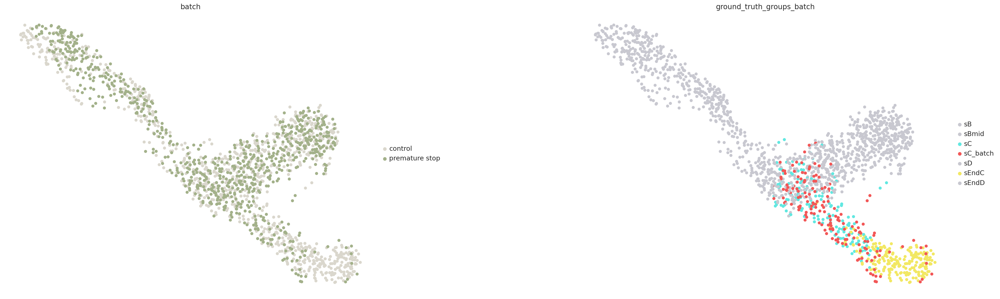

In [ ]:
sc.pl.umap(corrected_adata, color=['batch', 'ground_truth_groups_batch'], palette = colors_map, wspace=0.4, frameon=False, size=140)


In [ ]:
corrected_adata.uns["iroot"] = np.flatnonzero(corrected_adata.obs['ground_truth_groups'] == 'sB')[0]
sc.tl.dpt(corrected_adata)

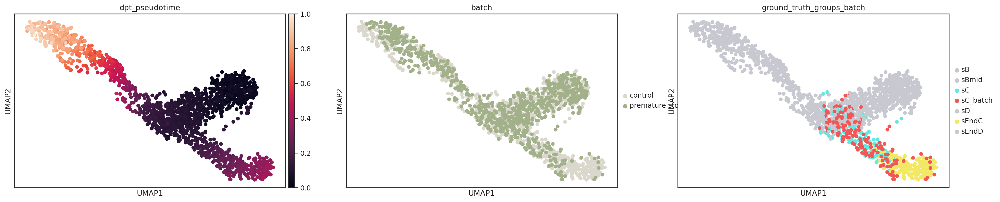

In [ ]:
sc.pl.umap(corrected_adata, color = ["dpt_pseudotime", "batch", "ground_truth_groups_batch"], palette = colors_map, size = 140)


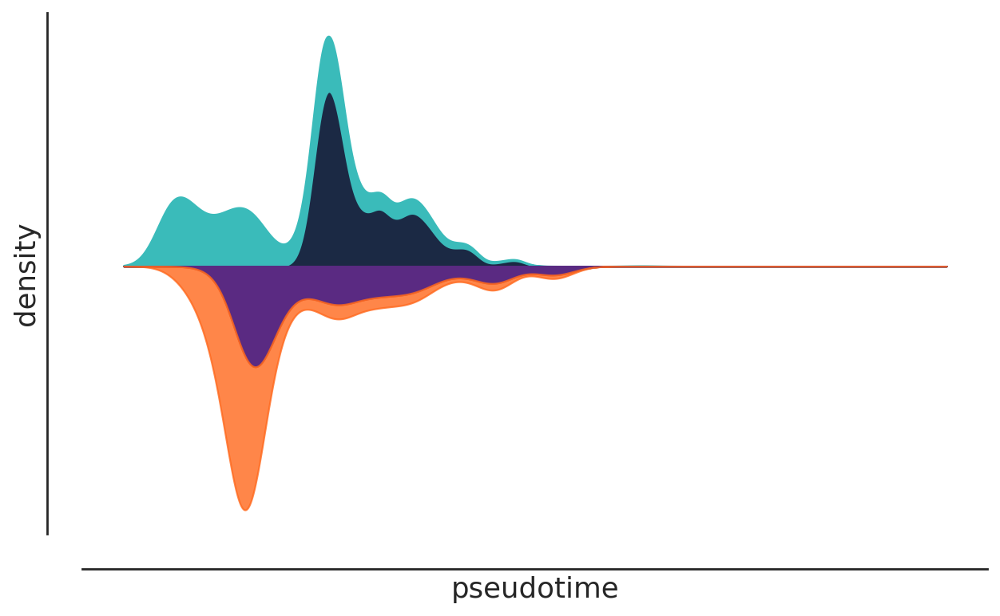

In [ ]:
adata_sep = adata_spatial[corrected_adata.obs["ground_truth_groups"].isin(["sB", "sBmid", "sC", "sEndC"])]

ctrl = adata_sep[adata_sep.obs["batch"] == "control"]
btch = adata_sep[(adata_sep.obs["batch"] == "premature stop") & ~(adata_sep.obs["ground_truth_groups_batch"].isin(("sEndC", "sC")))]
remv = adata_sep[(adata_sep.obs["batch"] == "control") & (adata_sep.obs["ground_truth_groups_batch"] == "sEndC") ] 
sC = adata_sep[(adata_sep.obs["batch"] == "premature stop") & (adata_sep.obs["ground_truth_groups_batch"] == "sC_batch")]


sns.set(rc = {'figure.figsize':(8,5)})
sns.set_style(style='white')

gkde = gaussian_kde(ctrl.obs.dpt_pseudotime, bw_method=0.2)
gkde2 = gaussian_kde(remv.obs.dpt_pseudotime, bw_method = 0.2)
gkde3 = gaussian_kde(btch.obs.dpt_pseudotime, bw_method = 0.2)
gkde4 = gaussian_kde(sC.obs.dpt_pseudotime, bw_method = 0.2)

# gkde = gaussian_kde(ctrl.obs.dpt_pseudotime)
# gkde2 = gaussian_kde(remv.obs.dpt_pseudotime)
# gkde3 = gaussian_kde(btch.obs.dpt_pseudotime)
# gkde4 = gaussian_kde(sC.obs.dpt_pseudotime)

x_range = np.linspace(0 - 0.05 * 1, 1 + 0.02 * 1, 1000)
y = gkde.evaluate(x_range)
y2 = gkde2.evaluate(x_range)
y3 = gkde3.evaluate(x_range)
y4 = gkde4.evaluate(x_range)
# plot removed


# removed
plt.plot(x_range, y2, linewidth = 0, color="#1b2944")
plt.fill_between(x_range, y2, color="#1b2944")

plt.plot(x_range, y+y2, linewidth=0, color="#3abbba")
plt.fill_between(x_range, y2, y+y2, color="#3abbba")

# sC
plt.plot(x_range, -y4, linewidth=0, color="#5a2a82")
plt.fill_between(x_range, -y4, color="#5a2a82")

plt.plot(x_range, -y3-y4, linewidth=0, color="#ff681c")
plt.fill_between(x_range, -y4, -y3-y4, color="#ff681c", alpha = 0.8)

plt.xticks([], [])
plt.yticks([], [])

sns.despine(offset = 20, trim=True)
plt.xlabel("pseudotime", fontsize = 16)
plt.ylabel("density", fontsize = 16)

plt.savefig("density.svg")
plt.tight_layout()

plt.show()

## Visualisations for hinxton

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
/home/louisedc/miniconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'groups' as categorical
/home/louisedc/miniconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'ground_truth_groups' as categorical
/home/louisedc/miniconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pand

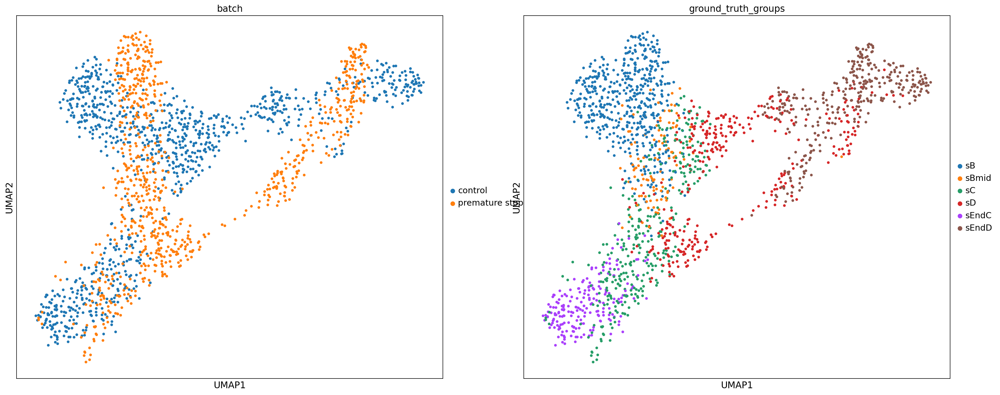

In [ ]:
ds0s = {"control": ct0, "premature stop": be0}
ds0 = ad.concat(ds0s, label = "batch")
ds0.obs_names_make_unique()
ds0_raw = ds0.copy()
sc.pp.neighbors(ds0_raw)
sc.tl.umap(ds0_raw)
sc.pl.umap(ds0_raw, color = ["batch", "ground_truth_groups"])

/home/louisedc/miniconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'groups' as categorical
/home/louisedc/miniconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'ground_truth_groups' as categorical
/home/louisedc/miniconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future versio

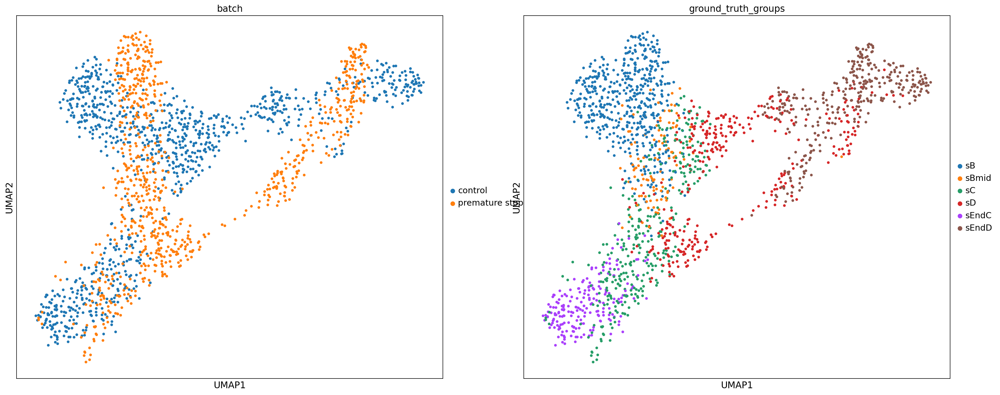

In [ ]:
sc.pp.neighbors(ds0)
sc.tl.umap(ds0)
sc.pl.umap(ds0, color = ["batch", "ground_truth_groups"])


/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


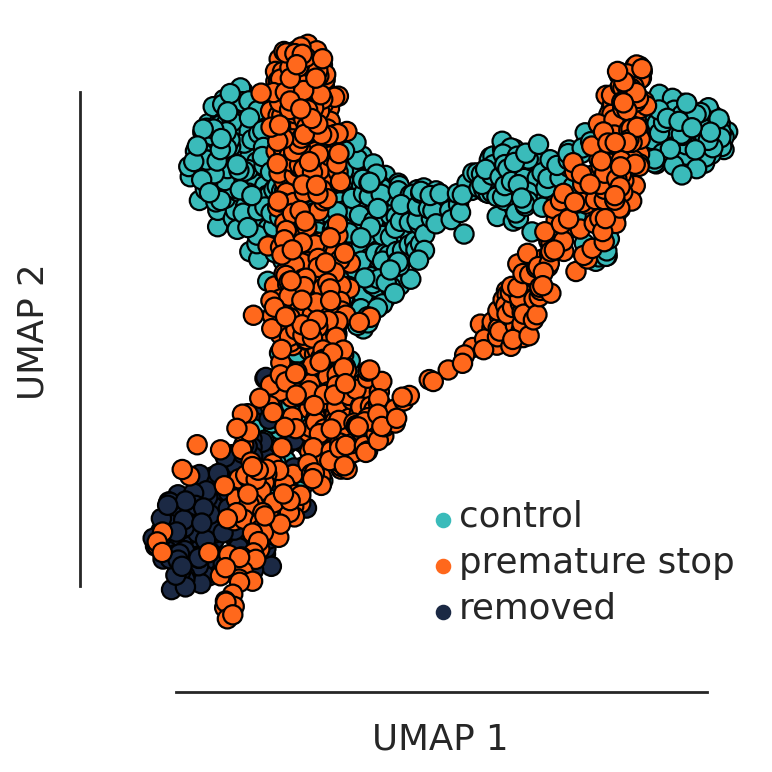

In [ ]:
sns.set(rc = {'figure.figsize':(5,5)})
sns.set_style(style='white')
ds0_raw.obs["color"] = ds0_raw.obs.batch
ds0_raw.obs["color"] = ds0_raw.obs["color"].cat.add_categories("removed")
ds0_raw.obs["color"] = ds0_raw.obs["color"].cat.reorder_categories(["control", "premature stop", "removed"])
ds0_raw.obs.loc[(ds0_raw.obs.ground_truth_groups == "sEndC"), "color"] = "removed"
g = sns.scatterplot(ds0_raw.obsm["X_umap"][:,0], ds0_raw.obsm["X_umap"][:,1], hue = ds0_raw.obs.color, palette = ["#3abbba", "#ff681c", "#1b2944"], s = 75, linewidth = 1, edgecolor = "black")
sns.despine(offset = 20, trim=True)
g.set(xticklabels=[])
g.set(yticklabels=[])
g.set_xlabel("UMAP 1", fontsize = 16)
g.set_ylabel("UMAP 2", fontsize = 16)
g.legend_.set_title(None)
plt.legend(frameon=False)

plt.setp(g.legend_.get_texts(), fontsize='16') # for legend text
plt.tight_layout()

plt.savefig("merge.svg")


/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


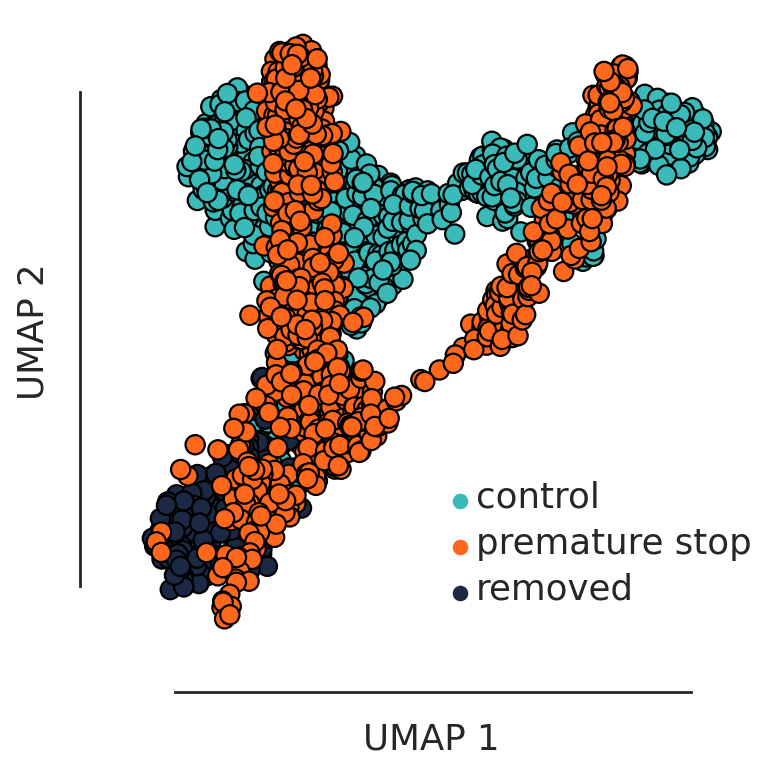

In [ ]:
sns.set(rc = {'figure.figsize':(5,5)})
sns.set_style(style='white')
ds0.obs["color"] = ds0.obs.batch
ds0.obs["color"] = ds0.obs["color"].cat.add_categories("removed")
ds0.obs["color"] = ds0.obs["color"].cat.reorder_categories(["control", "premature stop", "removed"])
ds0.obs.loc[(ds0.obs.ground_truth_groups == "sEndC"), "color"] = "removed"
g = sns.scatterplot(ds0.obsm["X_umap"][:,0], ds0.obsm["X_umap"][:,1], hue = ds0.obs.color, palette = ["#3abbba", "#ff681c", "#1b2944"], s = 75, linewidth = 1, edgecolor = "black")
sns.despine(offset = 20, trim=True)
g.set(xticklabels=[])
g.set(yticklabels=[])
g.set_xlabel("UMAP 1", fontsize = 16)
g.set_ylabel("UMAP 2", fontsize = 16)
g.legend_.set_title(None)
plt.legend(bbox_to_anchor=(0.5, 0.3), frameon= False)

plt.setp(g.legend_.get_texts(), fontsize='16') # for legend text
plt.tight_layout()

plt.savefig("merge_bbknn.svg")



In [ ]:
h

<a list of 0 Line2D objects>

/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


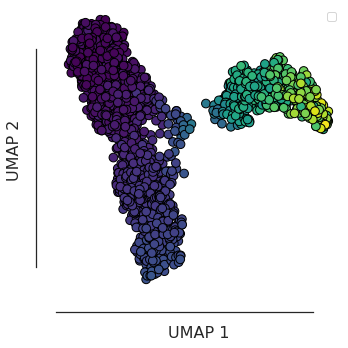

In [ ]:
sns.set(rc = {'figure.figsize':(5,5)})
sns.set_style(style='white')
sc.tl.umap(ds0)

g = sns.scatterplot(ds0.obsm["X_umap"][:,0], ds0.obsm["X_umap"][:,1], hue = ds0.obs.dpt_pseudotime, palette="viridis", s = 75, linewidth = 1, edgecolor = "black")
sns.despine(offset = 20, trim=True)
g.set(xticklabels=[])
g.set(yticklabels=[])
g.set_xlabel("UMAP 1", fontsize = 16)
g.set_ylabel("UMAP 2", fontsize = 16)
plt.legend([], [])
plt.tight_layout()
plt.savefig("pseudotime_merge.svg")


In [ ]:
ds0.obs

,pseudotime,groups,ground_truth_groups,pt_warped,sim_time,cell_id,from,to,percentage,branch,ground_truth,batch,color
5,0.000000,1,sB,0.000000,70.000000,cell6,sA,sB,0.528967,0,0.194712,control,control
297,0.004481,1,sB,0.007764,40.000000,cell298,sA,sB,0.294773,0,0.108506,control,control
487,0.004523,1,sB,0.010020,60.000000,cell488,sA,sB,0.355227,0,0.130758,control,control
313,0.004861,1,sB,0.011560,10.000000,cell314,sA,sB,0.083123,0,0.030598,control,control
374,0.005334,1,sB,0.011560,90.083333,cell375,sA,sB,0.646096,0,0.237827,control,control
...,...,...,...,...,...,...,...,...,...,...,...,...,...
708-1,0.366338,4,sC,0.521545,766.800000,cell709,sBmid,sC,0.976190,1,0.735586,batcheffect,batcheffect
541-1,0.392793,4,sC,0.521545,520.083333,cell542,sBmid,sC,0.931548,1,0.723898,batcheffect,batcheffect
807-1,0.405786,4,sC,0.521545,520.083333,cell808,sBmid,sC,0.998512,1,0.741430,batcheffect,batcheffect
406-1,0.406945,4,sC,0.522280,510.083333,cell407,sBmid,sC,0.933036,1,0.724287,batcheffect,batcheffect


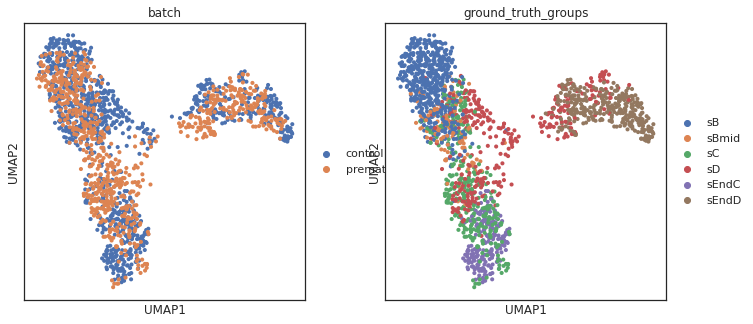

In [ ]:
sc.external.pp.bbknn(ds0, batch_key='batch')  # running bbknn 1.3.6
sc.tl.umap(ds0)
sc.pl.umap(ds0, color = ["batch", "ground_truth_groups"])

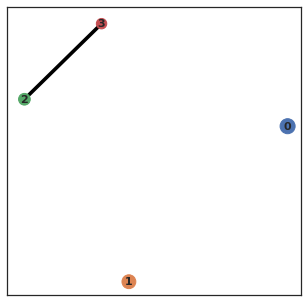

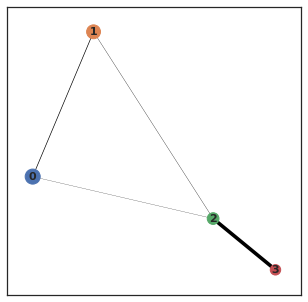

In [ ]:
sc.tl.leiden(ds0, resolution = 0.6)
sc.tl.paga(ds0)
sc.pl.paga(ds0, threshold = 0.2)
sc.pl.paga(ds0)

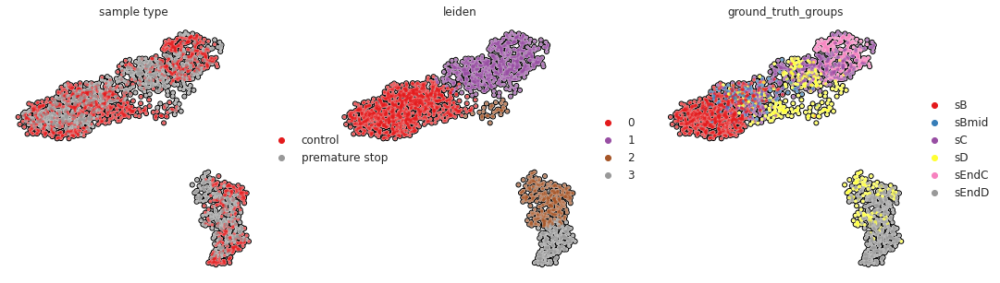

In [ ]:
sc.tl.umap(ds0, init_pos = "paga")
sc.pl.umap(ds0, color=['batch', "leiden", "ground_truth_groups"], add_outline=True, size = 50,
               legend_fontsize=12, legend_fontoutline=2,frameon=False,
               title='sample type', palette='Set1')

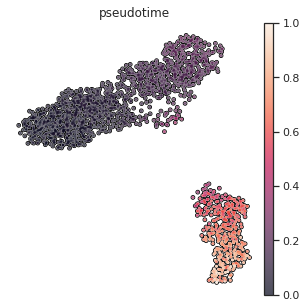

In [ ]:
ds0.uns['iroot'] = np.flatnonzero(ds0.obs['leiden'] == "0")[0]
sc.tl.dpt(ds0)
sc.pl.umap(ds0, color='dpt_pseudotime', add_outline=True, size = 30,
               legend_fontsize=12, legend_fontoutline=2,frameon=False,
               title='pseudotime', palette = "Set1")

In [ ]:
ctrl = ds0[ds0.obs["batch"] == "control"]
btch = ds0[ds0.obs["batch"] == "batcheffect"]



[Text(0, 0.5, 'density')]

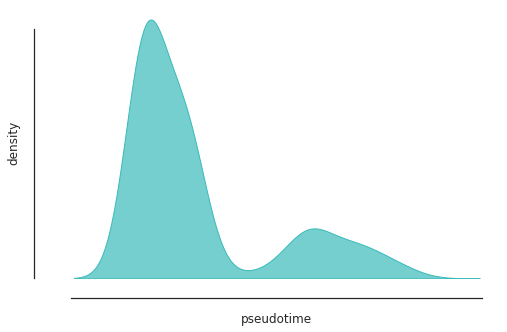

In [ ]:
sns.set(rc = {'figure.figsize':(8,5)})
sns.set_style(style='white')

fig = sns.kdeplot(btch.obs['dpt_pseudotime'], fill=True, alpha = 0.9, color="#ff681c")

g = sns.kdeplot(ctrl.obs['dpt_pseudotime'], fill=True, alpha = 0.7,color="#3abbba")

sns.despine(offset = 20, trim=True)
g.set(xticklabels=[])
g.set(yticklabels=[])
g.set(xlabel="pseudotime")
g.set(ylabel="density")


/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.5 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)
/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 1 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='pseudotime', ylabel='density'>

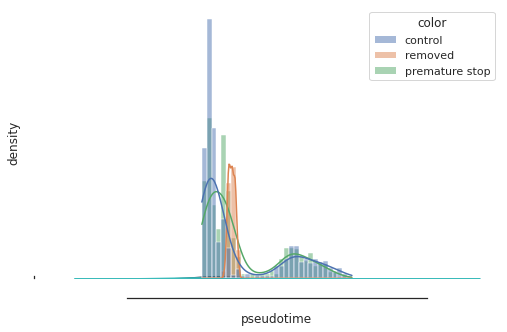

In [ ]:
ds0.obs["color"] = ds0.obs.batch
ds0.obs["color"] = ds0.obs["color"].cat.add_categories("removed")
ds0.obs["color"] = ds0.obs["color"].cat.reorder_categories(["control", "removed", "premature stop"])
ds0.obs.loc[(ds0.obs.ground_truth_groups == "sEndC"), "color"] = "removed"

ctrl = ds0[ds0.obs["color"] == "control"]
btch = ds0[ds0.obs["color"] == "batcheffect"]
remv = ds0[ds0.obs["color"] == "premature stop"] 

sns.set(rc = {'figure.figsize':(8,5)})
sns.set_style(style='white')


fig2  = sns.kdeplot(remv.obs["dpt_pseudotime"], fill = True, alpha = 1, color = "#1b2944", bw=0.5)
fig = sns.kdeplot(btch.obs['dpt_pseudotime'], fill=True, alpha = 0.9, color="#ff681c")

g = sns.kdeplot(ctrl.obs['dpt_pseudotime'], fill=True, alpha = 0.7,color="#3abbba", bw=1)

sns.despine(offset = 20, trim=True)
g.set(xticklabels=[])
g.set(yticklabels=[])
g.set(xlabel="pseudotime")
g.set(ylabel="density")

sns.histplot(data=ds0.obs, x="dpt_pseudotime", hue="color", kde=True)


<AxesSubplot:xlabel='dpt_pseudotime', ylabel='Count'>

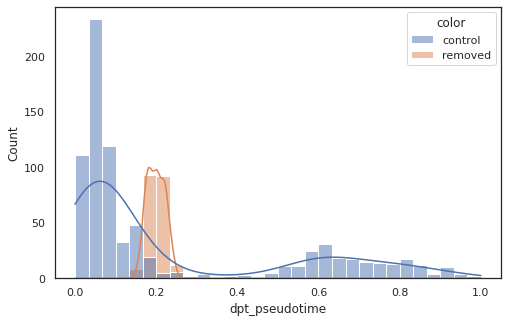

In [ ]:
ctrl_both = ds0[ds0.obs["batch"] == "control"]
btch = ds0[ds0.obs["batch"] == "premature stop"]

sns.despine(offset = 20, trim=True)
g.set(xticklabels=[])
g.set(yticklabels=[])
g.set(xlabel="pseudotime")
g.set(ylabel="density")

sns.histplot(data=ctrl_both.obs, x="dpt_pseudotime", hue="color", kde=True)

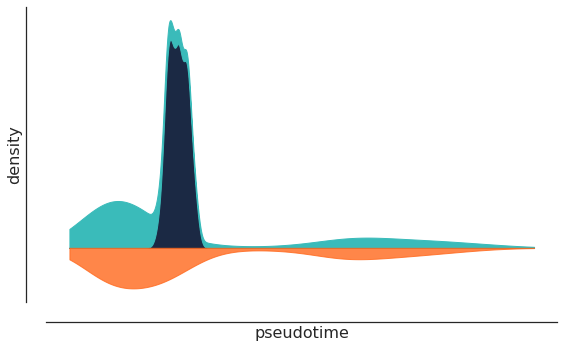

In [ ]:
ds0.obs["color"] = ds0.obs.batch
ds0.obs["color"] = ds0.obs["color"].cat.add_categories("removed")
ds0.obs["color"] = ds0.obs["color"].cat.reorder_categories(["control", "removed", "premature stop"])
ds0.obs.loc[(ds0.obs.ground_truth_groups == "sEndC"), "color"] = "removed"

ctrl = ds0[ds0.obs["color"] == "control"]
btch = ds0[ds0.obs["color"] == "premature stop"]
remv = ds0[ds0.obs["color"] == "removed"] 

sns.set(rc = {'figure.figsize':(8,5)})
sns.set_style(style='white')

gkde = gaussian_kde(ctrl.obs.dpt_pseudotime, bw_method=0.05)
gkde2 = gaussian_kde(remv.obs.dpt_pseudotime, bw_method = 0.3)
gkde3 = gaussian_kde(btch.obs.dpt_pseudotime, bw_method = 0.05)

gkde = gaussian_kde(ctrl.obs.dpt_pseudotime)
gkde2 = gaussian_kde(remv.obs.dpt_pseudotime)
gkde3 = gaussian_kde(btch.obs.dpt_pseudotime)

x_range = np.linspace(0 - 0.05 * 1, 1 + 0.02 * 1, 1000)
y = gkde.evaluate(x_range)
y2 = gkde2.evaluate(x_range)
y3 = gkde3.evaluate(x_range)
# plot removed
plt.plot(x_range, y2, linewidth = 0, color="#1b2944")
plt.fill_between(x_range, y2, color="#1b2944")


plt.plot(x_range, y+y2, linewidth=0, color="#3abbba")
plt.fill_between(x_range, y2, y+y2, color="#3abbba")

plt.plot(x_range, -y3, linewidth=0, color="#ff681c")
plt.fill_between(x_range, -y3, color="#ff681c", alpha = 0.8)

plt.xticks([], [])
plt.yticks([], [])

sns.despine(offset = 20, trim=True)
plt.xlabel("pseudotime", fontsize = 16)
plt.ylabel("density", fontsize = 16)

plt.savefig("density.svg")
plt.tight_layout()

plt.show()


# plt.xticklabels=[]
# plt.set(yticklabels=[])
# plt.set(xlabel="pseudotime")
# plt.set(ylabel="density")



In [ ]:
matrix = np.load("../../distances_matrix.npy")
matrix = matrix[1:,1:]

path1 = np.load("../../path1.npy")
path2 = np.load("../../path2.npy")


/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

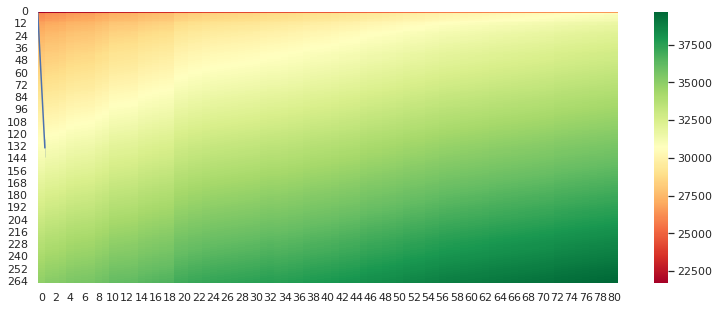

In [ ]:
sns.set(rc = {'figure.figsize':(13,5)})

sns.heatmap(matrix, cmap = "RdYlGn")
sns.lineplot(path2, path1)


<AxesSubplot:>

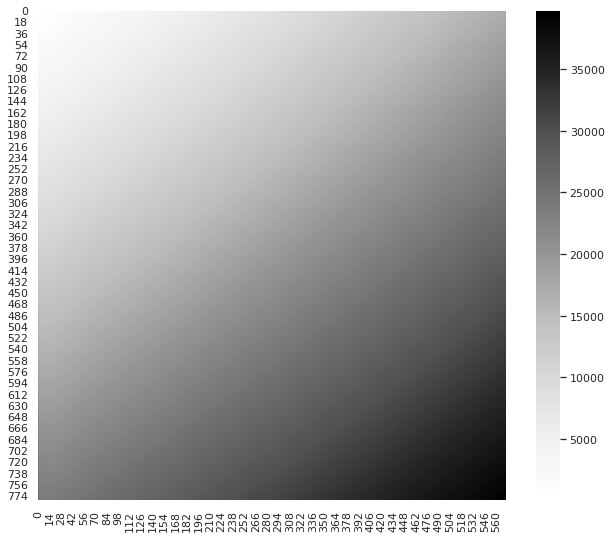

In [ ]:
distances = np.load("../../distances.npy")
sns.set(rc = {'figure.figsize':(10.5,9)})

sns.heatmap(distances, cmap = "Greys")


In [ ]:
import dtw

lin1 = ct0[ct0.obs.ground_truth_groups.isin(("sB", "sC", "sEndC", "sBMid"))]
lin2 = be0[be0.obs.ground_truth_groups.isin(("sB", "sC", "sEndC", "sBMid"))]

Importing the dtw module. When using in academic works please cite:
  T. Giorgino. Computing and Visualizing Dynamic Time Warping Alignments in R: The dtw Package.
  J. Stat. Soft., doi:10.18637/jss.v031.i07.



In [ ]:
be0.X.shape

(795, 534)

In [ ]:
ct0.X.shape

(1000, 534)

In [ ]:
be0.X[1:10, 1:5]

array([[-0.86040807,  0.94980544, -0.81334007, -0.95128906],
       [-0.86040807, -1.0611594 , -0.81334007,  1.1516765 ],
       [ 1.5932508 , -1.0611594 , -0.81334007,  1.1231912 ],
       [ 1.2455121 , -1.0611594 , -0.81334007, -0.95128906],
       [ 1.2174126 ,  0.95460576,  1.3197287 , -0.95128906],
       [-0.86040807, -1.0611594 ,  1.3352677 , -0.95128906],
       [-0.86040807,  1.3579203 , -0.81334007, -0.95128906],
       [-0.86040807,  1.3021184 , -0.81334007, -0.95128906],
       [-0.86040807, -1.0611594 , -0.81334007,  1.1790231 ]],
      dtype=float32)

In [ ]:
sort_indices = be0.obs.pseudotime.values.argsort()
sort_indices

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [ ]:
print(dtw.symmetric1)
print(dtw.typeIIIc)

Step pattern recursion:
 g[i,j] = min(
     g[i-1,j-1] +     d[i  ,j  ] ,
     g[i  ,j-1] +     d[i  ,j  ] ,
     g[i-1,j  ] +     d[i  ,j  ] ,
 ) 

Normalization hint: NA

Step pattern recursion:
 g[i,j] = min(
     g[i-1,j-2] +     d[i  ,j  ] ,
     g[i-1,j-1] +     d[i  ,j  ] ,
     g[i-2,j-1] +     d[i-1,j  ] +     d[i  ,j  ] ,
     g[i-2,j-2] +     d[i-1,j  ] +     d[i  ,j  ] ,
 ) 

Normalization hint: N



In [ ]:
dtw.rabinerJuangStepPattern()

In [ ]:
def skip_dtw(x, y):
    r, c = len(x), len(y)
    cost = scipy.spatial.distance.cdist(x, y, 'euclidean')
    distances = np.zeros((r + 1, c + 1))
    # distances[1:, 1:] = cost
    distances[0, 1:], distances[1:, 0] = np.inf, np.inf
    distances[0, 0] = 0

    for i in range(1, r + 1):
        for j in range(1, c + 1):
            options = [distances[i - 1, j - 1],
                       distances[i - 1, j],
                       distances[i, j - 1]]
            distances[i, j] = min(options) + cost[i-1, j-1]

    # path = _traceback(distances)
    # import seaborn as sns
    # sns.heatmap(distances[1:,1:])
    # np.save("distances.npy", distances[1:, 1:])

    return distances[-1, -1], cost, distances#, path

def skip_traceback(D):
    i, j = np.array(D.shape) - 1

    # j = np.argmin(D[:,-1])

    p, q = [i], [j]
    while (i > 0) or (j > 0):
        tb = np.argmin((2*D[i - 1, j - 1], D[i, j - 1], D[i - 1, j]))
        if tb == 0:
            i -= 1
            j -= 1
        elif tb == 1:
            j -= 1
        elif tb == 2:  # (tb == 2):
            i -= 1
        p.insert(0, i)
        q.insert(0, j)
    return np.array(p), np.array(q)   


def skip_traceback2(D):
    i, j = np.array(D.shape) - 1

    # j = np.argmin(D[:,-1])

    p, q = [i], [j]
    while (i > 0) or (j > 0):
        tb = np.argmin((2*D[i - 1, j - 1], D[i, j - 1], D[i - 1, j], 2*D[i - 2, j - 2], D[i, j - 2], D[i - 2, j]))
        if tb == 0:
            i -= 1
            j -= 1
        elif tb == 1:
            j -= 1
        elif tb == 2:  # (tb == 2):
            i -= 1
        elif tb == 3:
            i -= 2
            j -= 2
        elif tb == 4:
            j -= 2
        elif tb == 5:
            i -= 2
        p.insert(0, i)
        q.insert(0, j)
    return np.array(p), np.array(q)     


In [ ]:
np.argmin(distances[:,-1])


15

/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

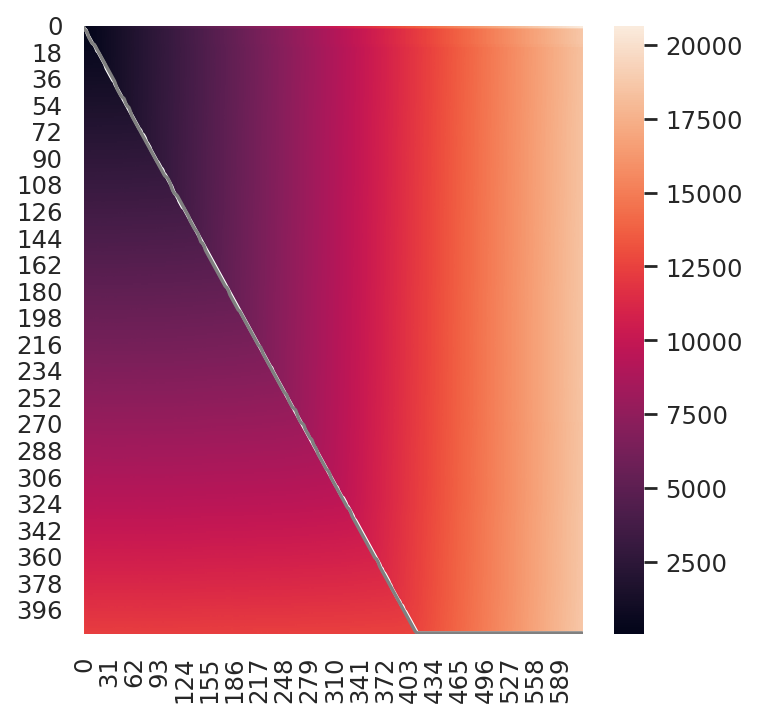

In [ ]:
_, cost, distances = skip_dtw(lin2.X, lin1.X)
index2, index1 = skip_traceback(distances[1:, 1:])

ax = sns.heatmap(distances[1:, 1:])
sns.lineplot(index1, index2, color = "white")

index22, index12 = skip_traceback2(distances[1:, 1:])
sns.lineplot(index12, index22, color = "grey")


/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

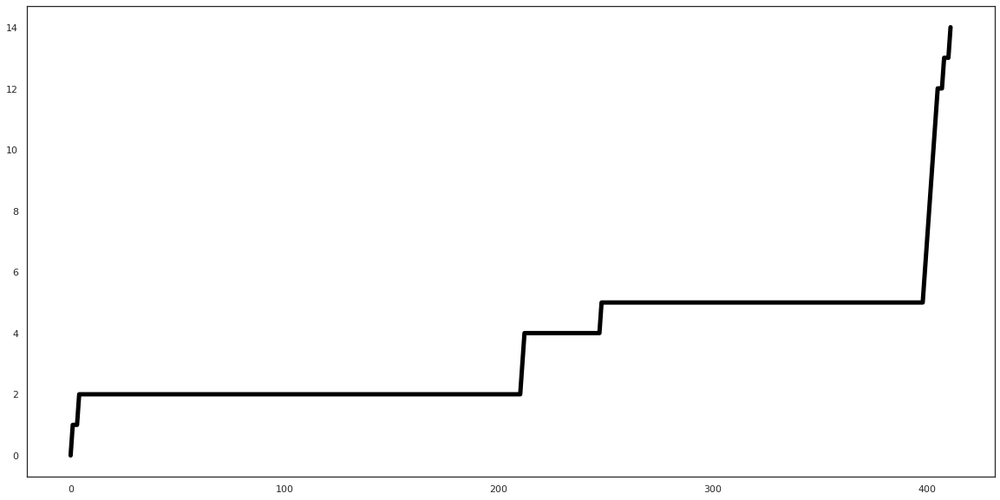

In [ ]:
sns.lineplot(index2, index1, linewidth = 5, color = "black")

In [ ]:
distances[:-1, :-1].shape

(617, 412)

/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

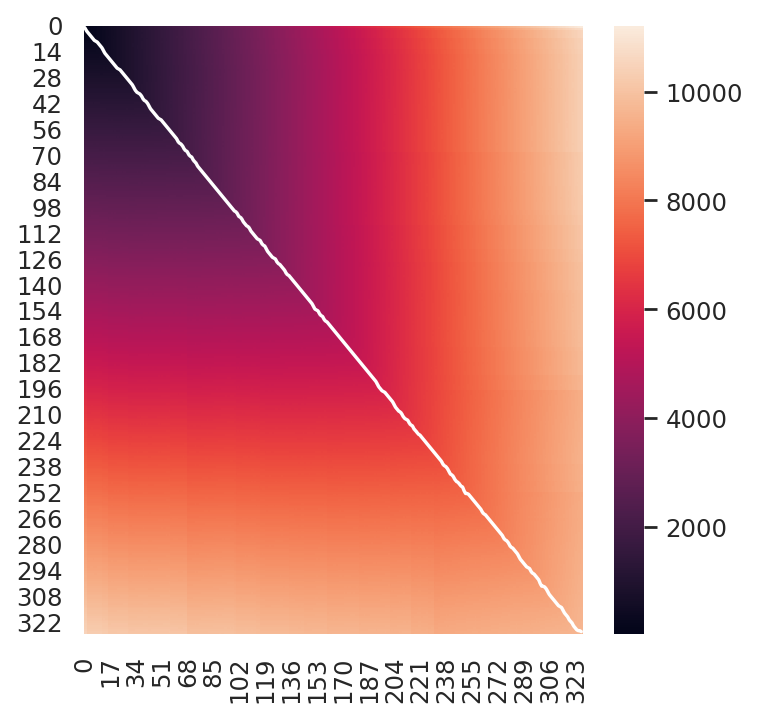

In [ ]:
_, cost2, distances2 = skip_dtw(lin4.X, lin3.X)
index4, index3 = skip_traceback(distances2[:-1, :-1])
ax = sns.heatmap(distances2[1:, 1:])
sns.lineplot(index3, index4, color = "white")

In [ ]:
# generate index combos for lineage 1 & 2

lin1_umap = lin1.obsm["X_umap"][:,0]
lin1_coord1 = lin1_umap[index1]
lin1_coord2 = lin1.obs["pseudotime"][index1]

lin2_umap = lin2.obsm["X_umap"][:,0]
lin2_coord1 = lin2_umap[index2]
lin2_coord2 = lin2.obs["pseudotime"][index2]

lin3_umap = lin3.obsm["X_umap"][:,0]
lin3_coord1 = lin3_umap[index3]
lin3_coord2 = lin3.obs["pseudotime"][index3]

lin4_umap = lin4.obsm["X_umap"][:,0]
lin4_coord1 = lin4_umap[index4]
lin4_coord2 = lin4.obs["pseudotime"][index4]

In [ ]:
min(index1), max(index1)

(0, 616)

/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warn

<AxesSubplot:xlabel='pseudotime'>

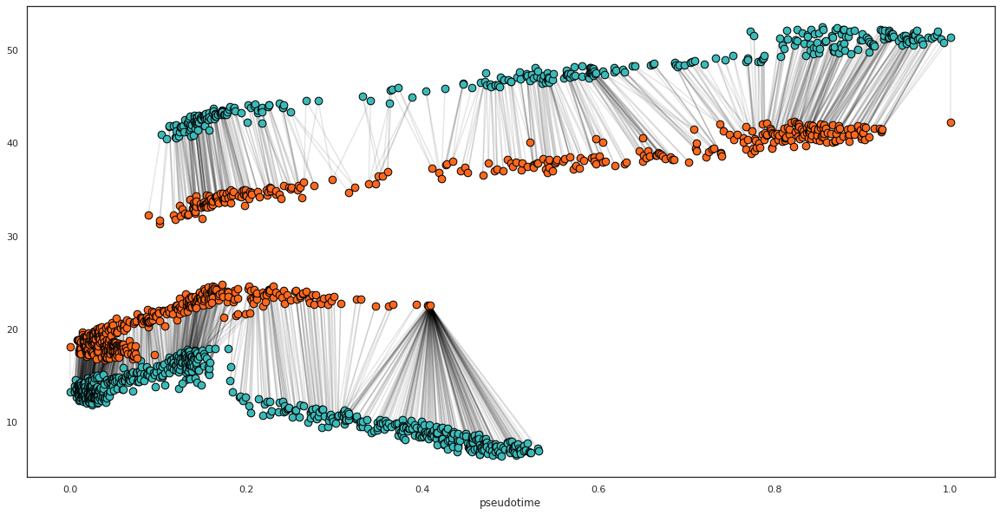

In [ ]:
coords = list(zip(lin1_coord2, lin2_coord2, lin1_coord1, lin2_coord1))[::]

for x1, x2, y1, y2 in coords:

    plt.plot([x1, x2], [y1, y2+5], color = "black", alpha = 0.1, zorder = 0)

coords2 = list(zip(lin3_coord2, lin4_coord2, lin3_coord1, lin4_coord1))[::]

for x1, x2, y1, y2 in coords2:

    plt.plot([x1, x2], [y1+25, y2+15], color = "black", alpha = 0.1, zorder = 0)

sns.scatterplot(lin1.obs.pseudotime, lin1.obsm["X_umap"][:,0], color = "#3abbba", zorder = 5, s = 75, linewidth = 1, edgecolor="black")
sns.scatterplot(lin2.obs.pseudotime, lin2.obsm["X_umap"][:,0] + 5, color = "#ff681c", zorder = 5, s = 75, linewidth = 1, edgecolor="black")

sns.scatterplot(lin3.obs.pseudotime, lin3.obsm["X_umap"][:,0] + 25, color = "#3abbba", zorder = 5, s = 75, linewidth = 1, edgecolor="black")
sns.scatterplot(lin4.obs.pseudotime, lin4.obsm["X_umap"][:,0] + 15, color = "#ff681c", zorder = 5, s = 75, linewidth = 1, edgecolor="black")

In [ ]:
alignment = dtw.dtw(lin1.X, lin2.X, keep_internals=True, step_pattern=dtw.symmetric1)

/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


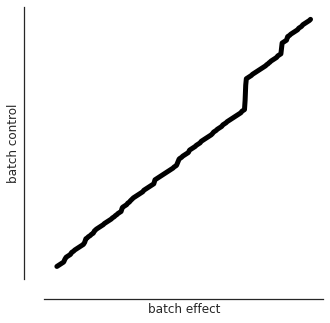

In [ ]:
sns.set(rc = {'figure.figsize':(5,5)})
sns.set_style(style='white')

# sns.heatmap(alignment.costMatrix)
sns.lineplot(alignment.index2, alignment.index1, linewidth = 5, color = "black")
plt.xticks([], [])
plt.xlabel("batch effect")
plt.yticks([], [])
plt.ylabel("batch control")
sns.despine(offset = 20, trim=True)
plt.show()

In [ ]:
lin3 = ct0[ct0.obs.ground_truth_groups.isin(("sD", "sEndD"))]
lin4 = be0[be0.obs.ground_truth_groups.isin(("sD", "sEndD"))]

In [ ]:
alignment2 = dtw.dtw(lin3.X, lin4.X, keep_internals = True, step_pattern=dtw.symmetric1)

/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


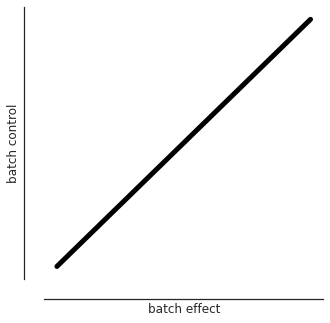

In [ ]:
sns.set(rc = {'figure.figsize':(5,5)})
sns.set_style(style='white')

# sns.heatmap(alignment.costMatrix)
sns.lineplot(alignment2.index2, alignment2.index1, linewidth = 5, color = "black")
plt.xticks([], [])
plt.xlabel("batch effect")
plt.yticks([], [])
plt.ylabel("batch control")
sns.despine(offset = 20, trim=True)
plt.show()

/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warn

<AxesSubplot:xlabel='ground_truth'>

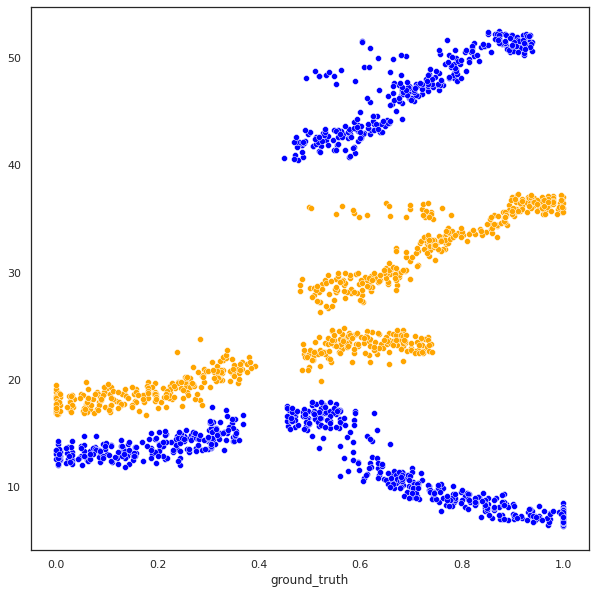

In [ ]:
sns.set(rc = {'figure.figsize':(10,10)})
sns.set_style(style='white')


sns.scatterplot(lin1.obs.ground_truth, lin1.obsm["X_umap"][:,0], color = "blue")
sns.scatterplot(lin2.obs.ground_truth, lin2.obsm["X_umap"][:,0] + 5, color = "orange")

sns.scatterplot(lin3.obs.ground_truth, lin3.obsm["X_umap"][:,0] + 25, color = "blue")
sns.scatterplot(lin4.obs.ground_truth, lin4.obsm["X_umap"][:,0] + 10, color = "orange")


In [ ]:
# generate index combos for lineage 1 & 2

lin1_umap = lin1.obsm["X_umap"][:,0]
lin1_coord1 = lin1_umap[alignment.index1]
lin1_coord2 = lin1.obs["pseudotime"][alignment.index1]

lin2_umap = lin2.obsm["X_umap"][:,0]
lin2_coord1 = lin2_umap[alignment.index2]
lin2_coord2 = lin2.obs["pseudotime"][alignment.index2]

lin3_umap = lin3.obsm["X_umap"][:,0]
lin3_coord1 = lin3_umap[alignment2.index1]
lin3_coord2 = lin3.obs["pseudotime"][alignment2.index1]

lin4_umap = lin4.obsm["X_umap"][:,0]
lin4_coord1 = lin4_umap[alignment2.index2]
lin4_coord2 = lin4.obs["pseudotime"][alignment2.index2]



In [ ]:
lin1.obs

,pseudotime,groups,ground_truth_groups,pt_warped,sim_time,cell_id,from,to,percentage,branch,ground_truth
5,0.000000,1,sB,0.000000,70.000000,cell6,sA,sB,0.528967,0,0.194712
297,0.004481,1,sB,0.007764,40.000000,cell298,sA,sB,0.294773,0,0.108506
487,0.004523,1,sB,0.010020,60.000000,cell488,sA,sB,0.355227,0,0.130758
313,0.004861,1,sB,0.011560,10.000000,cell314,sA,sB,0.083123,0,0.030598
374,0.005334,1,sB,0.011560,90.083333,cell375,sA,sB,0.646096,0,0.237827
...,...,...,...,...,...,...,...,...,...,...,...
336,0.521388,2,sEndC,0.237141,690.000000,cell337,sC,sEndC,1.000000,0,1.000000
161,0.521545,2,sEndC,0.308153,730.000000,cell162,sC,sEndC,1.000000,0,1.000000
435,0.523016,2,sEndC,0.407646,766.800000,cell436,sC,sEndC,1.000000,0,1.000000
733,0.531311,2,sEndC,0.408347,480.083333,cell734,sC,sEndC,1.000000,0,1.000000


/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warn

<AxesSubplot:xlabel='pseudotime'>

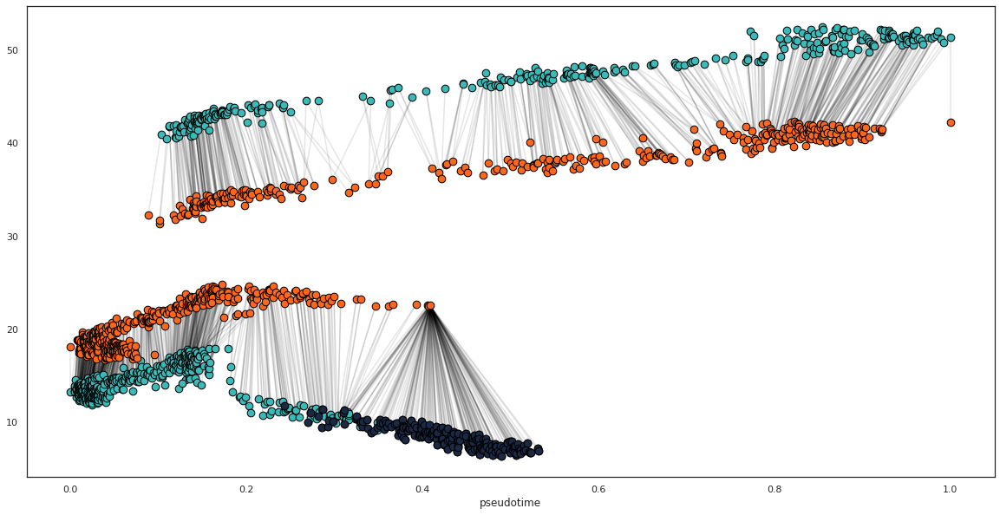

In [ ]:
sns.set(rc = {'figure.figsize':(20,10)})
sns.set_style(style='white')




coords = list(zip(lin1_coord2, lin2_coord2, lin1_coord1, lin2_coord1))[::]

for x1, x2, y1, y2 in coords:

    plt.plot([x1, x2], [y1, y2+5], color = "black", alpha = 0.1, zorder = 0)

coords2 = list(zip(lin3_coord2, lin4_coord2, lin3_coord1, lin4_coord1))[::]

for x1, x2, y1, y2 in coords2:

    plt.plot([x1, x2], [y1+25, y2+15], color = "black", alpha = 0.1, zorder = 0)

sns.scatterplot(lin1.obs.pseudotime, lin1.obsm["X_umap"][:,0], color = "#3abbba", zorder = 5, s = 75, linewidth = 1, edgecolor="black")
sns.scatterplot(lin2.obs.pseudotime, lin2.obsm["X_umap"][:,0] + 5, color = "#ff681c", zorder = 5, s = 75, linewidth = 1, edgecolor="black")

sns.scatterplot(lin3.obs.pseudotime, lin3.obsm["X_umap"][:,0] + 25, color = "#3abbba", zorder = 5, s = 75, linewidth = 1, edgecolor="black")
sns.scatterplot(lin4.obs.pseudotime, lin4.obsm["X_umap"][:,0] + 15, color = "#ff681c", zorder = 5, s = 75, linewidth = 1, edgecolor="black")

x5 = removed.obs.pseudotime
y5 = removed.obsm["X_umap"][:,0]
sns.scatterplot(x5, y5, color = "#1b2944", zorder = 5, s = 75, linewidth = 1, edgecolor="black")



/tmp/ipykernel_21984/1710122083.py:1: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  from scipy.ndimage.interpolation import rotate
/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the

<AxesSubplot:xlabel='pseudotime'>

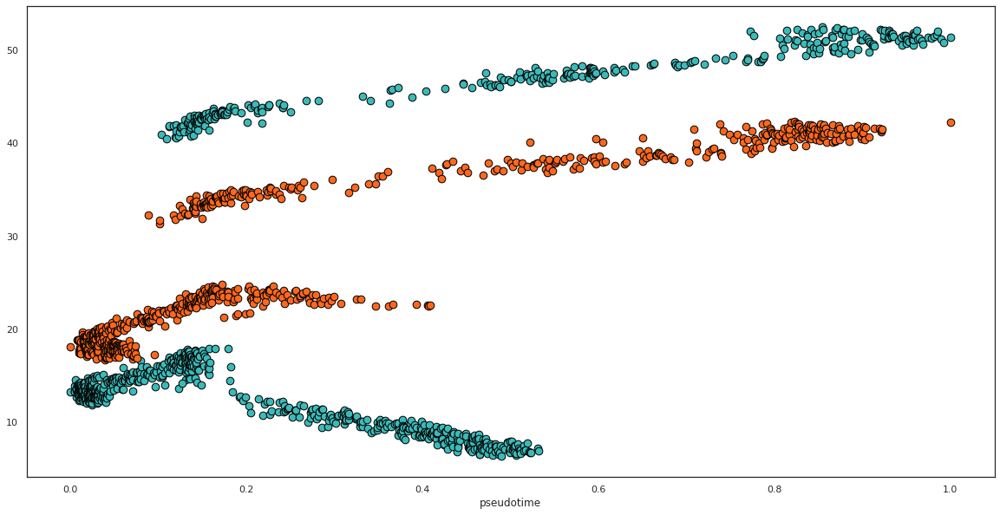

In [ ]:
from scipy.ndimage.interpolation import rotate

sns.scatterplot(lin1.obs.pseudotime, lin1.obsm["X_umap"][:,0], color = "#3abbba", zorder = 5, s = 75, linewidth = 1, edgecolor="black")
sns.scatterplot(lin2.obs.pseudotime, lin2.obsm["X_umap"][:,0] + 5, color = "#ff681c", zorder = 5, s = 75, linewidth = 1, edgecolor="black")

x3 = lin3.obs.pseudotime
y3 = lin3.obsm["X_umap"][:,0] + 25

rotated = rotate(np.array([x3, y3]), angle=30)

x4 = lin4.obs.pseudotime

sns.scatterplot(lin3.obs.pseudotime, lin3.obsm["X_umap"][:,0] + 25, color = "#3abbba", zorder = 5, s = 75, linewidth = 1, edgecolor="black")
sns.scatterplot(lin4.obs.pseudotime, lin4.obsm["X_umap"][:,0] + 15, color = "#ff681c", zorder = 5, s = 75, linewidth = 1, edgecolor="black")

In [ ]:
import math

def rotate(origin, point, angle):
    """
    Rotate a point counterclockwise by a given angle around a given origin.

    The angle should be given in radians.
    """
    ox, oy = origin
    px, py = point

    qx = ox + math.cos(angle) * (px - ox) - math.sin(angle) * (py - oy)
    qy = oy + math.sin(angle) * (px - ox) + math.cos(angle) * (py - oy)
    return qx, qy

In [ ]:
coord_rot = [rotate((0,0), (x, y), math.radians(30)) for x, y in zip(x3, y3)]
x3_rot = [x[0] for x in coord_rot]
y3_rot = [x[1] for x in coord_rot]
coord_rot

[(-20.378749036967942, 35.50263058283629),
 (-20.105996364056292, 35.04232658562548),
 (-20.78538414596536, 36.225435145767854),
 (-20.82497265228946, 36.29428733376107),
 (-20.81784350834773, 36.291972290774815),
 (-20.21619820505807, 35.25330321626127),
 (-20.868816368700084, 36.384592208515386),
 (-20.54855233593883, 35.83123791586009),
 (-20.168298594320152, 35.17285465826337),
 (-20.237438234830638, 35.29707415977411),
 (-20.500037582204296, 35.753716933300915),
 (-20.715397450035223, 36.12897501295029),
 (-20.775691367005436, 36.23404418007224),
 (-20.758950843752505, 36.20627265012753),
 (-20.82919376911747, 36.33183734467441),
 (-20.47626006615986, 35.72371370670114),
 (-21.131066436550128, 36.85913525760841),
 (-20.950984474648205, 36.553134606248165),
 (-20.94454195120533, 36.542934926655235),
 (-20.996184588639583, 36.63320359290536),
 (-20.426274289231813, 35.64880835780625),
 (-21.185020038695825, 36.96321350356743),
 (-21.322136806928444, 37.20265948008811),
 (-20.5921779

In [ ]:
min(x3)

0.10280092805624008

/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warn

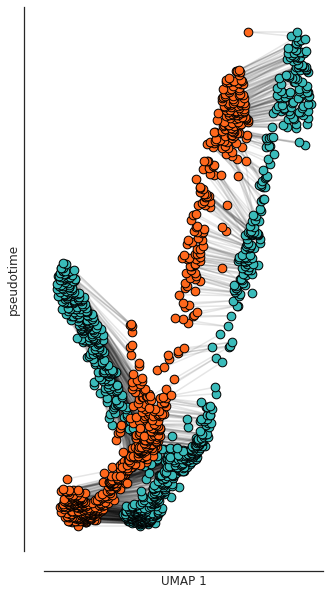

In [ ]:
sns.set(rc = {'figure.figsize':(5,10)})
sns.set_style(style='white')

sns.scatterplot(lin1.obsm["X_umap"][:,0], lin1.obs.pseudotime, color = "#3abbba", zorder = 5, s = 75, linewidth = 1, edgecolor="black")
sns.scatterplot(lin2.obsm["X_umap"][:,0] - 5, lin2.obs.pseudotime, color = "#ff681c", zorder = 5, s = 75, linewidth = 1, edgecolor="black")

x3 = lin3.obs.pseudotime
y3 = lin3.obsm["X_umap"][:,0]


sns.scatterplot(y3, x3, color = "#3abbba", zorder = 5, s = 75, linewidth = 1, edgecolor="black")
sns.scatterplot(lin4.obsm["X_umap"][:,0] - 5, lin4.obs.pseudotime, color = "#ff681c", zorder = 5, s = 75, linewidth = 1, edgecolor="black")

coords = list(zip(lin1_coord2, lin2_coord2, lin1_coord1, lin2_coord1))[::]
for y1, y2, x1, x2 in coords:
    plt.plot([x1, x2- 5], [y1, y2], color = "black", alpha = 0.1, zorder = 0)

coords2 = list(zip(lin3_coord2, lin4_coord2, lin3_coord1, lin4_coord1))[::]
for y1, y2, x1, x2 in coords2:
    plt.plot([x1, x2 - 5], [y1, y2], color = "black", alpha = 0.1, zorder = 0)

plt.xticks([], [])
plt.xlabel("UMAP 1")
plt.yticks([], [])
plt.ylabel("pseudotime")
sns.despine(offset = 20, trim=True)
plt.savefig("alignment_reversed.svg")
plt.show()

In [ ]:
removed = lin1[lin1.obs.ground_truth_groups == "sEndC"]
removed.obs

,pseudotime,groups,ground_truth_groups,pt_warped,sim_time,cell_id,from,to,percentage,branch,ground_truth,ground_truth_groups_batch
115,0.243302,4,sEndC,0.160224,630.000000,cell116,sC,sEndC,0.020213,0,0.701455,sEndC
626,0.269505,4,sEndC,0.160224,370.083333,cell627,sC,sEndC,0.052632,0,0.711334,sEndC
883,0.272575,4,sEndC,0.160224,330.083333,cell884,sC,sEndC,0.000000,0,0.695297,sEndC
355,0.281060,4,sEndC,0.160224,310.083333,cell356,sC,sEndC,0.086282,0,0.721587,sEndC
346,0.285307,2,sEndC,0.160224,620.000000,cell347,sC,sEndC,0.000000,0,0.695297,sEndC
...,...,...,...,...,...,...,...,...,...,...,...,...
336,0.521388,2,sEndC,0.160224,690.000000,cell337,sC,sEndC,1.000000,0,1.000000,sEndC
161,0.521545,2,sEndC,0.160224,730.000000,cell162,sC,sEndC,1.000000,0,1.000000,sEndC
435,0.523016,2,sEndC,0.160224,766.800000,cell436,sC,sEndC,1.000000,0,1.000000,sEndC
733,0.531311,2,sEndC,0.160224,480.083333,cell734,sC,sEndC,1.000000,0,1.000000,sEndC


/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/louisedc/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warn

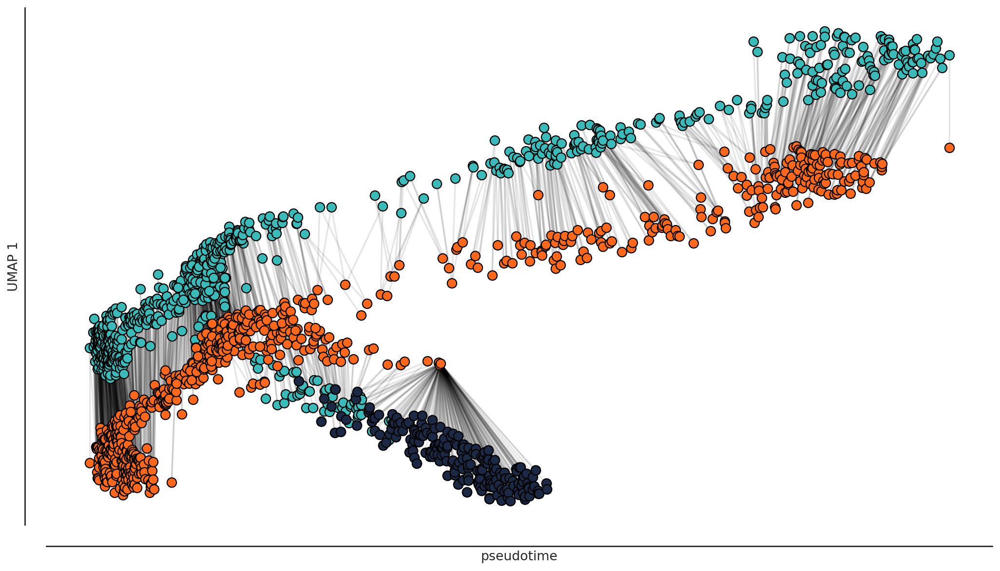

In [ ]:
sns.set(rc = {'figure.figsize':(13,7.5)})
sns.set_style(style='white')

sns.scatterplot(lin1.obs.pseudotime, lin1.obsm["X_umap"][:,0], color = "#3abbba", zorder = 5, s = 75, linewidth = 1, edgecolor="black")
sns.scatterplot(lin2.obs.pseudotime, lin2.obsm["X_umap"][:,0] - 5, color = "#ff681c", zorder = 5, s = 75, linewidth = 1, edgecolor="black")

x3 = lin3.obs.pseudotime
y3 = lin3.obsm["X_umap"][:,0]


x5 = removed.obs.pseudotime
y5 = removed.obsm["X_umap"][:,0]

sns.scatterplot(x3, y3, color = "#3abbba", zorder = 5, s = 75, linewidth = 1, edgecolor="black")
sns.scatterplot(lin4.obs.pseudotime, lin4.obsm["X_umap"][:,0] - 5, color = "#ff681c", zorder = 5, s = 75, linewidth = 1, edgecolor="black")
sns.scatterplot(x5, y5, color = "#1b2944", zorder = 5, s = 75, linewidth = 1, edgecolor="black")

coords = list(zip(lin1_coord2, lin2_coord2, lin1_coord1, lin2_coord1))[::]
for x1, x2, y1, y2 in coords:
    plt.plot([x1, x2], [y1, y2-5], color = "black", alpha = 0.1, zorder = 0)

coords2 = list(zip(lin3_coord2, lin4_coord2, lin3_coord1, lin4_coord1))[::]
for x1, x2, y1, y2 in coords2:
    plt.plot([x1, x2], [y1, y2-5], color = "black", alpha = 0.1, zorder = 0)

plt.xticks([], [])
plt.xlabel("pseudotime")
plt.yticks([], [])
plt.ylabel("UMAP 1")
sns.despine(offset = 20, trim=True)
plt.savefig("alignment2.svg")
plt.tight_layout()
plt.show()


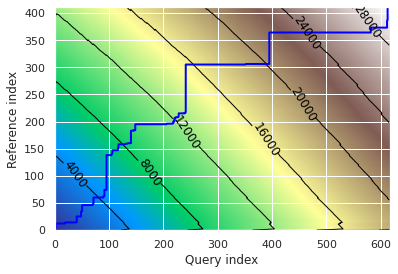

<AxesSubplot:xlabel='Query index', ylabel='Reference index'>

In [ ]:
dtw.dtwPlot(alignment, type="density")

In [ ]:
res = ct0[ct0.obs.ground_truth_groups.isin(("sB", "sBmid", "sC"))]
res.X.shape

(467, 534)

In [ ]:
res2 = be0[be0.obs.ground_truth_groups.isin(("sB", "sBmid", "sC"))]
res2.X.shape

(467, 534)

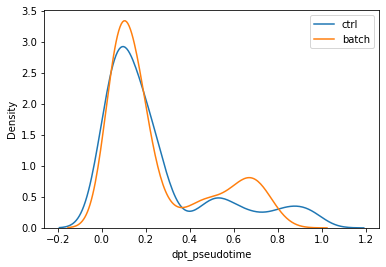

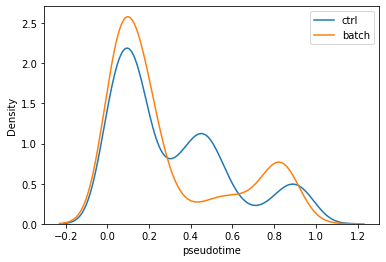

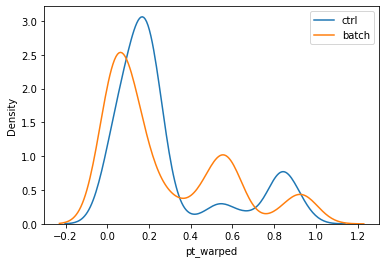

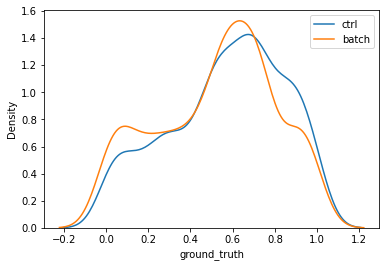

In [ ]:
import seaborn as sns
sns.kdeplot(ctrl.obs["dpt_pseudotime"], label = "ctrl")
sns.kdeplot(btch.obs["dpt_pseudotime"], label = "batch")
plt.legend()

plt.figure()
sns.kdeplot(ctrl.obs["pseudotime"], label = "ctrl")
sns.kdeplot(btch.obs["pseudotime"], label = "batch")
plt.legend()

plt.figure()
sns.kdeplot(ct0.obs["pt_warped"], label = "ctrl")
sns.kdeplot(be0.obs["pt_warped"], label = "batch")
plt.legend()

plt.figure()
sns.kdeplot(ct0.obs["ground_truth"], label = "ctrl")
sns.kdeplot(be0.obs["ground_truth"], label = "batch")
plt.legend()


In [ ]:
ds0.obs

,pseudotime,groups,ground_truth_groups,pt_warped,sim_time,cell_id,from,to,percentage,branch,ground_truth,batch,leiden,dpt_pseudotime
0,0.000000,3,sD,0.000000,510.083333,cell1,sBmid,sD,0.873572,0,0.664271,control,2,0.719390
650,0.014928,3,sEndD,0.010251,370.083333,cell651,sD,sEndD,0.483941,0,0.813065,control,2,0.756515
996,0.019628,3,sEndD,0.013016,390.083333,cell997,sD,sEndD,0.490954,0,0.814772,control,2,0.601115
250,0.020223,3,sEndD,0.013016,290.000000,cell251,sD,sEndD,0.402595,0,0.793269,control,2,0.557938
267,0.022692,3,sD,0.013016,766.800000,cell268,sBmid,sD,0.936786,0,0.679784,control,2,0.661855
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
970-1,0.919630,2,sEndD,0.987172,720.000000,cell971,sD,sEndD,0.768583,1,0.941372,batcheffect,2,0.780366
124,0.920909,2,sEndD,0.987172,530.083333,cell125,sD,sEndD,0.730715,1,0.931540,batcheffect,2,0.812864
883,0.921190,2,sEndD,0.988933,710.000000,cell884,sD,sEndD,0.792426,1,0.947563,batcheffect,2,0.799361
464-1,0.921928,2,sEndD,0.990694,766.800000,cell465,sD,sEndD,0.879383,1,0.970140,batcheffect,2,0.710720


In [ ]:
def calculate_distances(control1, control2, control3, be1, be2, be3):
    conditions = ["pseudotime", "pt_warped", "ground_truth"]
    controls = [control1, control2, control3]
    bes = [be1, be2, be3]

    distances = dict()

    all_ds = [control1, control2, control3, be1, be2, be3]

    for x, control in enumerate(controls):
        for y, be in enumerate(bes):
            for z, condition in enumerate(conditions):
                groups = set(be.obs.ground_truth_groups)
                x_range = np.linspace(0 - 0.2 * 1, 1 + 0.2 * 1, 1000)

                for group in groups:
                    y1 = gaussian_kde(control[control.obs.ground_truth_groups == group].obs[condition], bw_method=None).evaluate(x_range)
                    y2 = gaussian_kde(be[be.obs.ground_truth_groups == group].obs[condition], bw_method=None).evaluate(x_range)

                    pt_d = scipy.stats.wasserstein_distance(y1, y2)

                    distances[(x,y,z)] = pt_d

    distances_all = []
    for condition in conditions:
        distances1 = []
        for ds in all_ds:
            distances2 = []
            for ds_2 in all_ds:
                x_range = np.linspace(0 - 0.2 * 1, 1 + 0.2 * 1, 1000)

                y1 = gaussian_kde(ds.obs[condition], bw_method=None).evaluate(x_range)
                y2 = gaussian_kde(ds_2.obs[condition], bw_method=None).evaluate(x_range)
                pt_d = scipy.stats.wasserstein_distance(y1, y2) 
               
                distances2.append(pt_d)
            
            distances1.append(distances2)
        distances_all.append(distances1)


    return distances, distances_all

In [ ]:
distances, pw_distances = calculate_distances(ct0, ct1, ct2, be0, be1, be2)

In [ ]:
pt_dist = np.asarray(pw_distances[0])
ptw_dist = np.asarray(pw_distances[1])
gt_dist = np.asarray(pw_distances[2])

<AxesSubplot:>

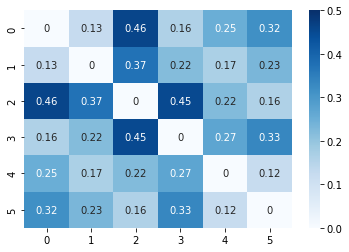

In [ ]:
seaborn.heatmap(pt_dist, vmin = 0.0, vmax = 0.5, cmap = "Blues", annot = True)


<AxesSubplot:>

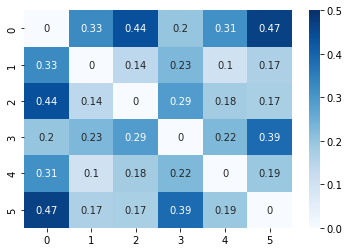

In [ ]:
seaborn.heatmap(ptw_dist, vmin = 0, vmax = 0.5, cmap = "Blues", annot = True)


<AxesSubplot:>

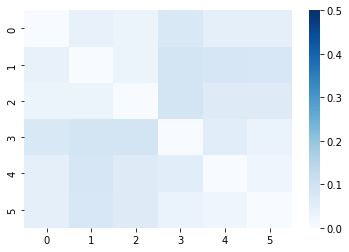

In [ ]:
seaborn.heatmap(gt_dist, vmin = 0, vmax = 0.5, cmap = "Blues")

<AxesSubplot:>

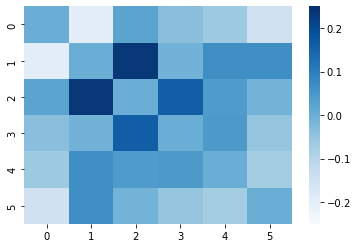

In [ ]:
seaborn.heatmap(pt_dist - ptw_dist, vmin = -0.25, vmax = 0.25, cmap = "Blues")

<AxesSubplot:>

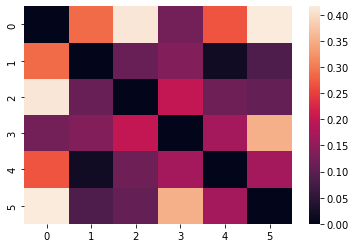